In [1]:
#Plotting!
%matplotlib notebook
from matplotlib import pyplot as plt
import matplotlib as mpl

# General Imports
import os, sys
from glob import glob # Glob.glob is more fun to say
from time import time 
import cluster_helper.cluster  # Parallelize by the same old antics

# Add some dimension to your life, np=arr, pd=labeled arr, xr=labeled N-D arr
import numpy as np # I say numpy like 'lumpy', no I don't mean num-pie
import pandas as pd # For Undergrads that say "But matlab makes it so much easier to view things"
import xarray as xr # N-D labels!

# Pizza ptsa stuff
from ptsa.data.TimeSeriesX import TimeSeriesX
from ptsa.data.readers import BaseEventReader, TalReader, EEGReader, JsonIndexReader

# EEG Toolbox NEW WAY OF IMPORTING!!!!
sys.path.append('/home2/loganf/SecondYear/Functions/CML/')
from GetData import get_sub_events, get_intrusions, get_sub_tal, get_sub_eeg, get_subs
from Utility.FrequencyCreator import logspace 
from SpectralAnalysis.RollingAverage import sliding_mean_fast
#from Utility.InclusionHelperFunctions import set_new_fields, apply_inclusion_criteria, get_valid_trials 
#from Utility.InclusionHelperFunctions import get_roi_indexes, morlet, 
from Utility.InclusionHelperFunctions import append_field_workaround
from Utility.RetrievalDeliberationCreation import get_matched_retrievals
from Stats.ZScoreFromWholeSession import BurkeZscoreNormalization
#from SpectralAnalysis.MentalChronometry import MentalChronometry
#from Utility.ZScoreMethods import ZScoreMethods


#Plotting!
%matplotlib notebook
from matplotlib import pyplot as plt
import matplotlib as mpl

# General Imports
import os, sys

from glob import glob # Glob.glob is more fun to say
from time import time 
import cluster_helper.cluster  # Parallelize by the same old antics

# EEG Toolbox NEW WAY OF IMPORTING!!!!
sys.path.append('/home2/loganf/SecondYear/Functions/CML/')
from GetData import get_sub_events, get_intrusions, get_sub_tal, get_sub_eeg, get_subs
from BrainPlots.BrainActivityWriter import Label
from BrainPlots.SphereBrainParc import get_avg_surface_spheres, get_avg_surface_spheres_ranges

Could not import MorletWaveletFilterCppLegacy (single-core C++ version of MorletWaveletFilter): cannot import name MorletWaveletTransform
You can still use MorletWaveletFilter


In [6]:
x,y,z = get_avg_surface_spheres_ranges(10, 3)
from itertools import product
z = product(x,y,z)


In [7]:
c = 0
for i in z:
    c += 1
c

70980

In [4]:
done_paths = glob('/scratch/loganf/RegionTesting/*/FR1/processed/deliberation/*zscored*')
done = np.unique([os.path.basename(s).split('_')[0] for s in done_paths])
len(done)

182

In [3]:
spheres_done = [x.split('/')[-1].split('_')[0] for x in glob('/scratch/loganf/spheres/*')]
y=[x for x in done if x not in spheres_done]

In [19]:
def func(subject):
    import sys
    sys.path.append('/home2/loganf/SecondYear/Functions/CML/')
    from BrainPlots.SphereBrainParc import get_avg_surface_spheres
    _ = get_avg_surface_spheres(subject)
    return

In [21]:
len(spheres_done)

181

In [27]:
np.unique(np.concatenate(sphere_path.values()))

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71])

In [12]:
func(done[0])
x = Load_Data('/scratch/loganf/spheres/R1001P_FR1')
x.keys()

125.633464098
saved successfully, file save as:
/scratch/loganf/spheres/R1001P_FR1



['34.75_-45.11_-24.04',
 '-58.25_5.89_-9.04',
 '49.75_38.89_8.96',
 '19.75_-9.11_-15.04',
 '40.75_38.89_5.96',
 '25.75_50.89_17.96',
 '-40.25_-30.11_50.96',
 '-19.25_-51.11_-15.04',
 '19.75_-18.11_-21.04',
 '22.75_-57.11_-15.04',
 '-58.25_-33.11_50.96',
 '40.75_-33.11_50.96',
 '-40.25_35.89_2.96',
 '52.75_-12.11_50.96',
 '40.75_-63.11_-9.04',
 '-46.25_44.89_-3.04',
 '37.75_-51.11_-27.04',
 '-49.25_-81.11_5.96',
 '43.75_-24.11_44.96',
 '-43.25_-30.11_62.96',
 '-58.25_-24.11_38.96',
 '-49.25_-24.11_41.96',
 '-13.25_-51.11_-9.04',
 '-22.25_-30.11_65.96',
 '19.75_-27.11_-12.04',
 '46.75_-66.11_-9.04',
 '-28.25_-9.11_-21.04',
 '-19.25_-9.11_-18.04',
 '37.75_-81.11_-9.04',
 '25.75_-6.11_-21.04',
 '31.75_-45.11_-18.04',
 '-40.25_-33.11_-24.04',
 '40.75_-21.11_-21.04',
 '-55.25_-12.11_47.96',
 '-58.25_-15.11_17.96',
 '31.75_-51.11_-15.04',
 '-34.25_-54.11_-21.04',
 '-52.25_20.89_-6.04',
 '-37.25_-36.11_-21.04',
 '-31.25_-15.11_-24.04',
 '49.75_-15.11_50.96',
 '-52.25_-9.11_35.96',
 '-55.25_-18

In [6]:
def Load_Data(savedfilename):
    """
    The purpose of this code is to be able to quickly load any kind of data
    using pickle.
    """
    import pickle

    try:

        with open(savedfilename, 'rb') as handle:
            loaded_data = pickle.load(handle)
            print
            'loaded successfully, fileloaded as as:\nloaded_data'
        return loaded_data
    except:
        import numpy as np
        loaded_data = np.load(savedfilename)
        return loaded_data

In [13]:
with cluster_helper.cluster.cluster_view(scheduler="sge", queue="RAM.q", 
                                         num_jobs=100, cores_per_job=1,
                                         extra_params={'mem':15}) as view:   
    output = view.map(func, done) 

2 Engines running
Sending a shutdown signal to the controller and engines.


CompositeError: one or more exceptions from call to method: func
[27:apply]: TypeError: ufunc 'subtract' did not contain a loop with signature matching types dtype('<U32') dtype('<U32') dtype('<U32')

In [159]:
save_path = '/scratch/loganf/spheres_single_time_point/*_FR1'.format(subject)
Save_Data(spheres, save_path)

{'31.75_41.89_17.96': array([[-0.74794357, -0.67859809, -0.60629694, -0.71828496, -0.62124521,
         -0.6795542 , -0.77740518, -0.8896196 , -0.92340224, -1.03289003,
         -1.00854674, -0.90929081, -0.93636911, -0.88986522, -0.998963  ,
         -0.96239964, -0.94211265, -0.93410906, -1.01402594, -0.94120944,
         -0.94013908, -0.92434904, -0.86488442, -0.81411957, -0.71099335,
         -0.56708586, -0.55983754, -0.4597102 , -0.41946012, -0.43864925,
         -0.50441004, -0.41842404, -0.4657283 , -0.45577627, -0.57326892,
         -0.51556419, -0.41390186, -0.46438345, -0.43321861, -0.30414027,
         -0.08979197, -0.15914556, -0.10660567, -0.02331923,  0.0025789 ,
         -0.05177458,  0.06892668,  0.15921663,  0.05721775,  0.0436037 ,
          0.08987912,  0.09854927,  0.04614013,  0.13464269,  0.11273694,
          0.1570091 ,  0.14838587,  0.23257754,  0.27490849,  0.3575787 ,
          0.42109592,  0.46648425,  0.47208272,  0.50718905,  0.58292911,
          0.59697

In [7]:
def load_spheres_correct_index(subject, bp):
    
    #channel_paths = '/scratch/loganf/electrode_information/{}/{}.npy'.format(subject, 'bp')   
    #if os.path.exists(channel_paths): 
        #bp = np.load(channel_paths)
        
    bp_to_index = {i:bp[i] for i in xrange(len(bp))}
    sphere_path = '/scratch/loganf/spheres/{}_FR1'.format(subject)
    sphere_path = Load_Data(sphere_path)
    
    for k,v in enumerate(sphere_path):
        sphere_path[v] = np.array([bp_to_index[j] for i,j in enumerate(sphere_path[v]) if j in bp_to_index.keys()])
    return sphere_path

def update_spheres(sphere_d, data):
    new_d = {}
    for k,v in enumerate(sphere_d):
        in_sphere = data.sel(bipolar_pairs=sphere_d[v])
        if len(in_sphere.data) > 0:
            new_d[v] = in_sphere.data
        #else:
            #sphere_d.pop(v)
        #if in_sphere.data.shape == (200,):
            #sphere_d[v] = in_sphere.data
        #else:
            #sphere_d[v] = np.nanmean(in_sphere.data,0)
    return new_d

In [73]:
for subject in spheres_done:
    try:
        from time import time
        s = time()
        # Default paths for loading subjects bp and electrode information

        atlas_path = '/scratch/loganf/subject_brain_atlas/{}.npy'.format(subject)

        if os.path.exists(atlas_path): 
            atlas = np.load(atlas_path)

        path = '/scratch/loganf/RegionTesting/{}/FR1/processed/deliberation/{}_zscored_*_hfa'
        path = glob(path.format(subject, subject))
        ts = TimeSeriesX.concat([TimeSeriesX.from_hdf(x) for x in path],'events')
        if len(ts['time']) != 200:
            continue
            
        test = tt_test_avg_filter(ts)
        #test = test[:,::50].mean('time')
        spheres = load_spheres_correct_index(subject, test['bipolar_pairs'].data)
        spheres = update_spheres(spheres, test)
        save_path = '/scratch/loganf/spheres_single_time_point/{}_FR1'.format(subject)
        Save_Data(spheres, save_path)
        print('total time', time()-s)
        
    except:
        print(subject)

R1001P
('baseline evs', 38)
('recall evs', 72)
(72, 200)

saved successfully, file save as:
/scratch/loganf/spheres_single_time_point/R1001P_FR1
('total time', 8.971029996871948)
R1002P
('baseline evs', 72)
('recall evs', 151)
(58, 200)

saved successfully, file save as:
/scratch/loganf/spheres_single_time_point/R1002P_FR1
('total time', 7.804250955581665)
R1003P
('baseline evs', 39)
('recall evs', 67)
(114, 200)

saved successfully, file save as:
/scratch/loganf/spheres_single_time_point/R1003P_FR1
('total time', 9.116167068481445)
R1006P
('baseline evs', 28)
('recall evs', 40)
(133, 200)

saved successfully, file save as:
/scratch/loganf/spheres_single_time_point/R1006P_FR1
('total time', 7.021137952804565)
R1018P
('baseline evs', 29)
('recall evs', 41)
(85, 200)

saved successfully, file save as:
/scratch/loganf/spheres_single_time_point/R1018P_FR1
('total time', 7.205891847610474)
R1010J
('baseline evs', 63)
('recall evs', 109)
(170, 200)

saved successfully, file save as:
/scratch

/home2/loganf/anaconda3/envs/ptsa_fresh/lib/python2.7/site-packages/ipykernel_launcher.py:130: RuntimeWarning: invalid value encountered in greater



saved successfully, file save as:
/scratch/loganf/spheres_single_time_point/R1026D_FR1
('total time', 5.65830397605896)
R1023J
('baseline evs', 15)
('recall evs', 26)
(126, 200)

saved successfully, file save as:
/scratch/loganf/spheres_single_time_point/R1023J_FR1
('total time', 4.878118991851807)
R1030J
('baseline evs', 28)
('recall evs', 58)
(109, 200)

saved successfully, file save as:
/scratch/loganf/spheres_single_time_point/R1030J_FR1
('total time', 4.355103015899658)
R1031M
('baseline evs', 40)
('recall evs', 62)
(14, 200)

saved successfully, file save as:
/scratch/loganf/spheres_single_time_point/R1031M_FR1
('total time', 1.4721128940582275)
R1027J
('baseline evs', 7)
('recall evs', 7)
(141, 200)

saved successfully, file save as:
/scratch/loganf/spheres_single_time_point/R1027J_FR1
('total time', 6.457134962081909)
R1033D
('baseline evs', 11)
('recall evs', 13)
(68, 200)

saved successfully, file save as:
/scratch/loganf/spheres_single_time_point/R1033D_FR1
('total time', 5

In [72]:
spheres

{'31.75_41.89_17.96': array([[-0.74794357, -0.67859809, -0.60629694, -0.71828496, -0.62124521,
         -0.6795542 , -0.77740518, -0.8896196 , -0.92340224, -1.03289003,
         -1.00854674, -0.90929081, -0.93636911, -0.88986522, -0.998963  ,
         -0.96239964, -0.94211265, -0.93410906, -1.01402594, -0.94120944,
         -0.94013908, -0.92434904, -0.86488442, -0.81411957, -0.71099335,
         -0.56708586, -0.55983754, -0.4597102 , -0.41946012, -0.43864925,
         -0.50441004, -0.41842404, -0.4657283 , -0.45577627, -0.57326892,
         -0.51556419, -0.41390186, -0.46438345, -0.43321861, -0.30414027,
         -0.08979197, -0.15914556, -0.10660567, -0.02331923,  0.0025789 ,
         -0.05177458,  0.06892668,  0.15921663,  0.05721775,  0.0436037 ,
          0.08987912,  0.09854927,  0.04614013,  0.13464269,  0.11273694,
          0.1570091 ,  0.14838587,  0.23257754,  0.27490849,  0.3575787 ,
          0.42109592,  0.46648425,  0.47208272,  0.50718905,  0.58292911,
          0.59697

In [12]:
paths = glob('/scratch/loganf/spheres_single_time_point/*_FR1')
my_d = {}
for path in paths:
    test = Load_Data(path)
    break
    for k,v in enumerate(test):
        if v not in my_d:
            my_d[v] = []
        if v in my_d:
            my_d[v].append(test[v][0])
    
    break
#my_d = {v:np.array(my_d[v]) for k,v in enumerate(my_d) if len(my_d[v]) > 5}

In [112]:
for k,v in enumerate(my_d):
    if len(my_d[v]) > 3:
        break
k

0

In [15]:
test[test.keys()[0]]

array([[-1.14143871, -1.13536847, -1.22277315, -1.37752004, -1.42162655,
        -1.41334885, -1.57589969, -1.66163019, -1.65037405, -1.70569211,
        -1.81813092, -1.84376696, -1.89189855, -1.97494276, -2.04421358,
        -2.00221512, -1.98587543, -2.17462973, -2.22060367, -2.13098386,
        -2.05598812, -2.00558661, -1.96718606, -2.11253754, -2.20225205,
        -2.17070254, -2.03622636, -1.86363669, -1.92587656, -1.87496476,
        -1.82099349, -1.82695374, -1.8781625 , -1.89153364, -1.92577175,
        -1.88445994, -1.78043096, -1.74593904, -1.6615204 , -1.61615349,
        -1.62554286, -1.53168732, -1.38901236, -1.30153522, -1.1951735 ,
        -1.01659541, -1.01656801, -0.96268592, -0.89577039, -0.84031359,
        -0.89870164, -0.84551892, -0.72423036, -0.61284688, -0.58476242,
        -0.57584302, -0.48895052, -0.3330769 , -0.35185303, -0.33118462,
        -0.27546993, -0.2308523 , -0.10965826,  0.00649677,  0.02880522,
        -0.03267553, -0.28355664, -0.29915273, -0.2

<IPython.core.display.Javascript object>


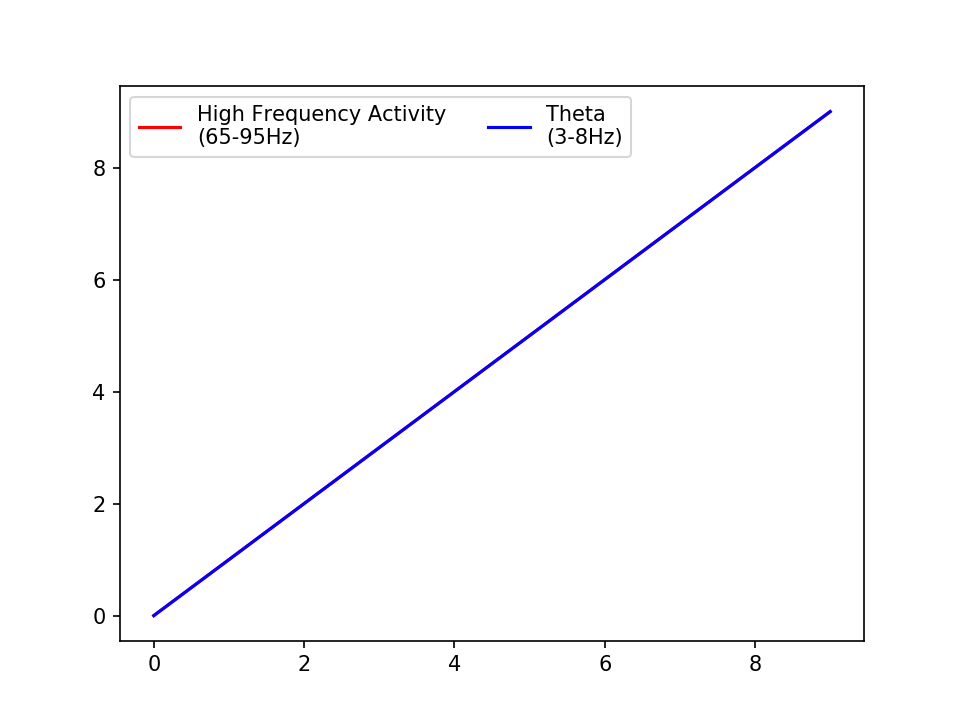

In [69]:
x = np.arange(10)
plt.plot(x, c ='r', label='High Frequency Activity\n(65-95Hz)')
plt.plot(x, c ='b', label='Theta\n(3-8Hz)')
plt.legend(ncol=2)

In [45]:
from scipy.stats import ttest_1samp

tstats, pvals = {}, {}
for k,v in enumerate(my_d):
    t, p =ttest_1samp(my_d[v], 0)
    pvals[v] = p
    tstats[v] = t

In [113]:
bp = test['bipolar_pairs'].data

bp_to_index = {i:bp[i] for i in xrange(len(bp))}
sphere_path = '/scratch/loganf/spheres/{}_FR1'.format(subject)
sphere_path = Load_Data(sphere_path)

for k,v in enumerate(sphere_path):
    sphere_path[v] = np.array([bp_to_index[j] for i,j in enumerate(sphere_path[v]) if j in bp_to_index.keys()])

In [62]:
boolean, p_adjust = fdr(pvals.values())
p_adjust

array([ 0.64573916,  0.82255712,  0.65628732, ...,  0.94109652,
        0.90675394,  0.85992145])

In [55]:
sys.path.append('/home2/loganf/statsmodels/')
from statsmodels.sandbox.stats.multicomp import fdrcorrection0 as fdr

In [57]:
from statsmodels.sandbox.stats.multicomp import fdrcorrection0 as fdr

In [8]:
def get_region_level_label(subject):
    """Returns a region level label [e.g. Left inferiorfrontal, Right hippocampus...]
    and corresponding valid bipolar_pairs for a subject
    """
    
    # Default paths for loading subjects bp and electrode information
    channel_paths = '/scratch/loganf/electrode_information/{}/{}.npy'.format(subject, 'bp')
    atlas_path = '/scratch/loganf/subject_brain_atlas/{}.npy'.format(subject)

    if os.path.exists(atlas_path): 
        atlas = np.load(atlas_path)
    if os.path.exists(channel_paths): 
        bp = np.load(channel_paths)
    else:
        print('something wrong with the path! Check out subject {}'.format(subject))
        return

    # Check that they have the relevant fields....
    has_stein = True if 'stein' in atlas['atlases'].dtype.names else False
    has_ind = True if 'ind' in atlas['atlases'].dtype.names else False
    has_avg = True if 'avg' in atlas['atlases'].dtype.names else False
    has_tal = True if 'tal' in atlas['atlases'].dtype.names else False

    # Values for hippocampal electrodes, used in a comparasion
    # Just makes a list of Left CA1, Right CA1...etc
    hpc = np.concatenate([[['Left ' + x], ['Right ' + x]] 
                          for x in ['CA1', 'CA2', 'CA3', 'DG']])

    # The atlas we're going to use, and the roi names 
    atlas_choice, names = 'none', None

    # Check the atlases and get the region name
    if has_ind:
        names = atlas['atlases']['ind']['region']
        atlas_choice = 'ind'

    elif has_tal:
        names = atlas['atlases']['tal']['region']
        atlas_choice = 'tal'

    elif has_avg:
        names = atlas['atlases']['avg']['region']
        atlas_choice = 'avg'


    # We're going to use the stein localization to determine if they are HPC electrodes....
    if has_stein:
        # If there's a stein atlas then we'll relabel the hpc!
        hpc_locs = np.where( np.in1d( atlas['atlases']['stein']['region'], 
                                      np.intersect1d(atlas['atlases']['stein']['region'], 
                                                     hpc) ) )
        names[hpc_locs] = 'hippocampus'

        # If there are still nones and there's a stein then try to replace it....
        has_nones = np.where(names==u'None')
        rename_if_valid = np.array([x if x != u'nan' else u'None' 
                                    for x in atlas['atlases']['stein']['region'][has_nones]])
        names[has_nones] = rename_if_valid

    # Remove any bad chanenls identified from electrode cat txt file
    my_channels = names[~atlas['bad ch']]
    # Remove any 'bad channels' labeled as 'None' b/c I have no idea where they are
    remove = np.where(my_channels!=u'None')

    # Get the hemisphere, remove bad channels from electrode cat file
    hemi = atlas['hemi']
    my_hemis = hemi[~atlas['bad ch']]
    # Put the hemi and roi together then return the names and valid bipolar pairs
    names = [' '.join(x) for x in zip(my_hemis[remove], my_channels[remove])]
    valid_bp = bp[~atlas['bad ch']][remove]

    return np.array(names).view(np.recarray), valid_bp


def copy_timeseries(timeseries, data_overide=False):
    """Copies a timeseries and returns the copy, if data_overide is not false then replace the data with the data_overide"""
    if data_overide:
        ts = TimeSeriesX.create(data=data_overide, dims=timeseries.dims, 
                                coords=timeseries.coords, samplerate=timeseries.samplerate)
        return ts
    return TimeSeriesX.create(data=timeseries.data, dims=timeseries.dims, 
                              coords=timeseries.coords, samplerate=timeseries.samplerate)

def avg_regions_remove_less_than_min_bp(ts, minimum=3):
    """returns ts.bipolar_pair_roi_count >=minimum"""
    df = pd.DataFrame(pd.Series(ts.bipolar_pairs).value_counts())
    valid = df[(df>=3)].dropna().index
    always_keep = np.intersect1d(np.unique(ts.bipolar_pairs),
                                 np.array(['Left Hippocampus', 
                                           'Right Hippocampus'])
                                )
    valid = np.append(always_keep, valid)
    return valid#ts.groupby('bipolar_pairs').mean('bipolar_pairs')


def valid_rois_minimum_magnitude(data, minimum_magnitude=1):
    locs_where_magnitude_above_1 = np.where(
        np.max(np.abs(data.data),1) >= minimum_magnitude)
    return data[locs_where_magnitude_above_1]
    

def tt_test_avg_filter(ts):
    from scipy.stats import ttest_ind, ttest_rel, ttest_1samp

    
    recalls = ts.sel(events=ts['events'].data['type']=='REC_WORD')
    bl = ts.sel(events=ts['events'].data['type']!='REC_WORD')

    t,p = ttest_ind(recalls, bl, 1)
    print(ts['events'].data['subject'][0])
    print('baseline evs', bl.shape[1])
    print('recall evs', recalls.shape[1])
    if (bl.shape[1]<5) or (recalls.shape[1]<5):
        return np.array(False)
    print(t.shape)

    t_stat = recalls[:,0,:]
    t_stat.data = t
    #print(t_stat)

    names, valid_bp = get_region_level_label(subject)

    # Select only valid bp and rename them
    t_stat = t_stat.sel(bipolar_pairs=valid_bp)
    #t_stat['bipolar_pairs'].data = names

    # Create a copy of t_stat to not mess up things
    mean = copy_timeseries(t_stat)

    locs_where_magnitude_above_1 = np.where(np.max(np.abs(mean.data),1)>1)
    mean = mean[locs_where_magnitude_above_1]

    # Get mean roi
    #mean = mean.groupby('bipolar_pairs').mean('bipolar_pairs')
    # Find out those with n<2 and discard them
    #mean = mean.sel(bipolar_pairs = avg_regions_remove_less_than_min_bp(t_stat))
    return mean

In [9]:
def Save_Data(dataframe, savedfilename): 
    """
    The purpose of this code is to be able to quickly save any kind of data 
    using pickle.
    """
    import pickle
    try:
        with open((savedfilename), 'wb') as handle:
            pickle.dump(dataframe, handle, protocol=pickle.HIGHEST_PROTOCOL)
        print 'saved successfully, file save as:\n' + savedfilename
    except:
        print 'failed to save'

        
        #Save_Da

In [25]:
from time import time
import numpy as np
from scipy.spatial.distance import euclidean
from os import path as op
from nibabel.freesurfer.io import read_geometry
from six import b
from scipy import sparse
from scipy.sparse import coo_matrix, csr_matrix
import nibabel as nib
import os, sys 
sys.path.append('/home2/loganf/SecondYear/Functions/CML/')
from GetData import get_sub_tal

def Save_Data(dataframe, savedfilename): 
    """
    The purpose of this code is to be able to quickly save any kind of data 
    using pickle.
    """
    import pickle
    try:
        with open((savedfilename), 'wb') as handle:
            pickle.dump(dataframe, handle, protocol=pickle.HIGHEST_PROTOCOL)
        print 'saved successfully, file save as:\n' + savedfilename
    except:
        print 'failed to save'

    
def get_avg_surface_spheres_ranges(radius=10, step=3):
    basedir='/data/eeg/freesurfer/subjects/'
    rh = nib.freesurfer.read_geometry(os.path.join(basedir, 'average/surf/rh.pial'))
    lh = nib.freesurfer.read_geometry(os.path.join(basedir, 'average/surf/lh.pial'))
    surface = np.concatenate((lh[0],rh[0]))

    x_min, x_max = np.min(surface[:,0]), np.max(surface[:,0])
    x_range = np.arange(x_min+radius, x_max-radius, step)

    y_min, y_max = np.min(surface[:,1]), np.max(surface[:,1])
    y_range = np.arange(y_min+radius, y_max-radius, step)

    z_min, z_max = np.min(surface[:,2]), np.max(surface[:,2])
    z_range = np.arange(z_min+radius, z_max-radius, step)
    return x_range, y_range, z_range

def get_avg_surface_spheres(subject, radius=10, step=3, 
                            save_path = '/scratch/loganf/spheres/{}_FR1'): 
    
    s = time()
    # Get tal and coords, use surface to make possible spheres
    #m,b,t = get_sub_tal(subject, 'FR1')
    
    #coords = np.vstack((t.avgSurf.x_snap, t.avgSurf.y_snap, t.avgSurf.z_snap)).T
    atlas_path = '/scratch/loganf/subject_brain_atlas/{}.npy'.format(subject)
    if os.path.exists(atlas_path):#channel_paths.format(subject, 'mp')):
        atlas = np.load(atlas_path)
    coords = np.concatenate([np.vstack((avg['x'],avg['y'],avg['z'])).T 
                             for avg in atlas['atlases']['avg.dural']])
    
    x_range, y_range, z_range = get_avg_surface_spheres_ranges(radius=radius, step=step)
    
    # Go through each sphere and find mataches
    subject_sphere_d = {}
    for x in x_range:
        for y in y_range:
            for z in z_range:
                sphere_center = np.array((x,y,z))
                matches = np.array([i for i,c in enumerate(coords) 
                                    if euclidean(sphere_center, c) < (radius)])

                if len(matches) > 0:
                    key = (str(x.round(2))+'_'+str(y.round(2))+'_'+str(z.round(2)))
                    subject_sphere_d[key] = matches
    print( time()-s )
    
    Save_Data(subject_sphere_d, save_path.format(subject))
    return subject_sphere_d

In [52]:
coord[0]

array([-40.0966965, -84.0447005,  25.574538 ])

In [56]:
euc(coord[0], loc)

-7.1668590000000059

In [55]:
def euc(a,b):
    ax, ay, az = a
    bx, by, bz = b
    dist = (((ax-bx)*2) + ((ay-by)*2) + ((az-bz)*2))*(1/2.)
    return dist
    

In [7]:
subject = 'R1111M'
#channel_paths = '/scratch/loganf/electrode_information/{}/{}.npy'
atlas_path = '/scratch/loganf/subject_brain_atlas/{}.npy'.format(subject)
if os.path.exists(atlas_path):#channel_paths.format(subject, 'mp')):
    atlas = np.load(atlas_path)
atlas['atlases']['avg.dural']['x']

array([-64.5034485, -61.0239315, -65.226696 , -66.0544665, -63.070961 ,
       -64.4371605, -61.2416365, -63.362709 , -59.994345 , -61.6485465,
       -58.385508 , -60.3158705, -55.1698265, -58.0658535, -51.837818 ,
       -62.5749495, -58.991665 , -65.264931 , -65.576481 , -64.7289085,
       -64.7605555, -63.769619 , -65.7719265, -61.970072 , -63.0910305,
       -59.996216 , -61.279289 , -54.733845 , -59.5694485, -52.0097275,
       -61.9931965, -59.165802 , -65.0721055, -62.7958395, -65.8035735,
       -65.115219 , -65.093338 , -64.649828 , -62.4002475, -64.0059395,
       -60.8525215, -62.1093385, -56.845331 , -59.737621 , -53.285822 ,
       -59.968445 , -58.1159325, -62.838953 , -59.551365 , -63.9614735,
       -62.716274 , -63.5624295, -61.2101195, -63.7150305, -61.399616 ,
       -60.994438 , -59.8421515, -56.178112 , -56.276638 , -52.075655 ,
       -57.6988525, -54.9871235, -59.428686 , -56.703211 , -59.96492  ,
       -57.4770295, -59.047306 , -57.180874 , -57.526737 , -55.5

In [22]:

avg_coords = np.concatenate([np.vstack((avg['x'],avg['y'],avg['z'])).T for avg in atlas['atlases']['avg']])
snap_coords = np.concatenate([np.vstack((avg['x'],avg['y'],avg['z'])).T for avg in atlas['atlases']['avg.dural']])

avg_coords[:,0]

array([-66.14 , -65.295, -66.335, -67.055, -63.665, -66.21 , -60.49 ,
       -63.03 , -58.595, -61.135, -56.725, -59.495, -53.81 , -57.13 ,
       -52.135, -66.21 , -65.9  , -66.93 , -67.655, -65.575, -66.81 ,
       -63.675, -64.92 , -62.035, -63.54 , -59.9  , -61.135, -55.455,
       -58.235, -52.735, -67.345, -65.455, -67.535, -67.225, -66.155,
       -66.365, -64.785, -64.475, -62.64 , -63.615, -59.47 , -61.21 ,
       -55.515, -58.31 , -53.84 , -65.335, -61.63 , -66.055, -63.935,
       -64.685, -63.6  , -63.305, -61.7  , -62.185, -60.84 , -60.05 ,
       -59.735, -56.635, -57.86 , -54.43 , -60.23 , -55.19 , -61.48 ,
       -58.56 , -60.615, -59.265, -59.235, -57.375, -58.39 , -56.005,
       -57.545, -55.16 , -55.655, -53.775, -51.36 , -53.52 , -46.12 ,
       -56.345, -51.875, -56.025, -53.63 , -54.145, -52.28 , -52.775,
       -50.39 , -51.39 , -49.005, -49.48 , -47.615, -45.715, -44.475,
       -37.57 , -49.16 , -44.95 , -49.885, -47.5  , -48.525, -46.645,
       -46.62 , -43.

In [10]:
from os import path as op
import time
import numpy as np
from nibabel.freesurfer.io import read_geometry
from six import b

from scipy import sparse
from scipy.sparse import coo_matrix, csr_matrix

import nibabel as nib
import os


class Label(object):
    """Code Written by Jim Kregal for writing annotation labels to the surface of an averaged suubject brain"""

    def __init__(self, tal, pos=None, values=None, hemi=None, comment="",
                 name=None, outdir=None, subject=None, verbose=None,
                 basedir='/data/eeg/freesurfer/subjects/', radius=3.0,
                 stat=None, smooth=0.0, x=None, y=None, z=None):
        if hemi == 'lh':
            self.surf = basedir + 'average/surf/lh.pial'

        elif hemi == 'rh':
            self.surf = basedir + 'average/surf/rh.pial'

        if x is None:
            x = tal['atlases']['avg.dural']['x']

        if y is None:
            y = tal['atlases']['avg.dural']['y']

        if z is None:
            z = tal['atlases']['avg.dural']['z']

        pos = np.vstack((x, y, z)).T

        # need to filter all the electrodes by hemisphere
        if hemi == 'lh':
            stat = stat[pos[:, 0] < 0]
            pos = pos[pos[:, 0] < 0]
        elif hemi == 'rh':
            stat = stat[pos[:, 0] > 0]
            pos = pos[pos[:, 0] > 0]

        # TODO: may want to exclude depth electrodes
        # TODO: may want to have minimum distance to surface

        self.surface = nib.freesurfer.read_geometry(os.path.join(basedir, 'average' + '/surf/' + hemi + '.pial'))
        self.cortex = np.sort(
            nib.freesurfer.read_label(os.path.join(basedir, 'average' + '/label/' + hemi + '.cortex.label')))
        self.sulc = nib.freesurfer.read_morph_data(os.path.join(basedir, 'average' + '/surf/lh.sulc'))

        self.pos = pos
        self.stat = stat

        self.radius = radius
        self.hemi = hemi
        self.comment = comment
        self.verbose = verbose
        self.subject = subject
        self.name = name
        self.outdir = outdir
        self.smooth = smooth / 2.35482

    def map_stat_to_label(self):

        self.coords, faces, vertices = self.get_vertices_from_surf()

        fnames = []
        elec_vertices = np.empty(self.pos.shape[0], dtype=int)

        filename = op.join(self.outdir, self.subject)
        path_head, name = op.split(filename)
        if name.endswith('.label'):
            name = name[:-6]
        if not (name.startswith(self.hemi) or name.endswith(self.hemi)):
            name += '-' + self.hemi
        filename = op.join(path_head, name) + '.label'

        start_time = time.time()

        self.counts = np.full(len(vertices), 0)
        self.vertices = vertices
        self.values = np.full(len(vertices), 0.)

        connectivity = mesh_dist(self.surface[1], self.surface[0])

        for i, elec_coord in enumerate(self.pos):
            elec_vertices[i] = self.get_nearest_vertex(elec_coord)[0]

        elec_dists = sparse.csgraph.dijkstra(connectivity, indices=elec_vertices)

        for i, e_dist in enumerate(elec_dists):
            self.values[np.where(((e_dist < self.radius) & (e_dist > 0.0)) | (vertices == elec_vertices[i]))] += \
            self.stat[i]
            self.counts[np.where(((e_dist < self.radius) & (e_dist > 0.0)) | (vertices == elec_vertices[i]))] += 1

        self.values = self.values / self.counts
        # TODO: may want to remove vertices, pos, values where there is no data to make a smaller label files
        label = write_label(filename, self)
        fnames.append(filename)

        return fnames

    def get_vertices_from_surf(self):
        '''

        :param hemi:
        :return:
        '''

        coords, faces = read_geometry(self.surf)
        vertices = np.arange(coords.shape[0])
        return coords, faces, vertices

    def get_nearest_vertex(self, elec_coord):
        '''

        :return:
        '''

        dist = np.linalg.norm(self.coords - elec_coord, axis=1)
        idx = np.where(dist == dist.min())[0]

        return idx


def write_label(filename, label, verbose=None):
    """Write a FreeSurfer label.
    Parameters
    ----------
    filename : string
        Path to label file to produce.
    label : Label
        The label object to save.
    verbose : bool, str, int, or None
        If not None, override default verbose level (see :func:`mne.verbose`
        and :ref:`Logging documentation <tut_logging>` for more).
    Notes
    -----
    Note that due to file specification limitations, the Label's subject and
    color attributes are not saved to disk.
    See Also
    --------
    write_labels_to_annot
    """

    with open(filename, 'wb') as fid:
        n_vertices = len(label.vertices)
        data = np.zeros((n_vertices, 5), dtype=np.float)
        data[:, 0] = label.vertices
        data[:, 1:4] = label.coords  # self.pos #1e3 *
        data[:, 4] = label.values
        fid.write(b("#%s\n" % label.comment))
        fid.write(b("%d\n" % n_vertices))
        for d in data:
            fid.write(b("%d %f %f %f %f\n" % tuple(d)))
    return label


def average_duplicates(vertices, pos, values):
    result_vertices = np.unique(vertices)
    result_values = np.empty(result_vertices.shape)
    result_pos = np.empty((1, len(result_vertices), 3))

    for i, vertex in enumerate(result_vertices):
        result_values[i] = np.mean(values[vertices == vertex])
        result_pos[0, i, :] = np.mean(pos[0, vertices == vertex, :], axis=0)

    return result_vertices, result_pos, result_values


def gaussian(dist, sig):
    return np.exp(-np.power(dist, 2.) / (2 * np.power(sig, 2.)))


def mesh_edges(tris):
    """Return sparse matrix with edges as an adjacency matrix.
    Parameters
    ----------
    tris : array of shape [n_triangles x 3]
        The triangles.
    Returns
    -------
    edges : sparse matrix
        The adjacency matrix.
    """
    if np.max(tris) > len(np.unique(tris)):
        raise ValueError('Cannot compute connectivity on a selection of '
                         'triangles.')

    npoints = np.max(tris) + 1
    ones_ntris = np.ones(3 * len(tris))

    a, b, c = tris.T
    x = np.concatenate((a, b, c))
    y = np.concatenate((b, c, a))
    edges = coo_matrix((ones_ntris, (x, y)), shape=(npoints, npoints))
    edges = edges.tocsr()
    edges = edges + edges.T
    return edges


def mesh_dist(tris, vert):
    """Compute adjacency matrix weighted by distances.
    It generates an adjacency matrix where the entries are the distances
    between neighboring vertices.
    Parameters
    ----------
    tris : array (n_tris x 3)
        Mesh triangulation
    vert : array (n_vert x 3)
        Vertex locations
    Returns
    -------
    dist_matrix : scipy.sparse.csr_matrix
        Sparse matrix with distances between adjacent vertices
    """
    edges = mesh_edges(tris).tocoo()

    # Euclidean distances between neighboring vertices
    dist = np.linalg.norm(vert[edges.row, :] - vert[edges.col, :], axis=1)
    dist_matrix = csr_matrix((dist, (edges.row, edges.col)), shape=edges.shape)
    return dist_matrix


def Load_Data(savedfilename):
    """
    The purpose of this code is to be able to quickly load any kind of data
    using pickle.
    """
    import pickle

    try:

        with open(savedfilename, 'rb') as handle:
            loaded_data = pickle.load(handle)
            print
            'loaded successfully, fileloaded as as:\nloaded_data'
        return loaded_data
    except:
        import numpy as np
        loaded_data = np.load(savedfilename)
        return loaded_data

In [11]:
def get_region_level_label(subject):
    """Returns a region level label [e.g. Left inferiorfrontal, Right hippocampus...]
    and corresponding valid bipolar_pairs for a subject
    """
    
    # Default paths for loading subjects bp and electrode information
    channel_paths = '/scratch/loganf/electrode_information/{}/{}.npy'.format(subject, 'bp')
    atlas_path = '/scratch/loganf/subject_brain_atlas/{}.npy'.format(subject)

    if os.path.exists(atlas_path): 
        atlas = np.load(atlas_path)
    if os.path.exists(channel_paths): 
        bp = np.load(channel_paths)
    else:
        print('something wrong with the path! Check out subject {}'.format(subject))
        return

    # Check that they have the relevant fields....
    has_stein = True if 'stein' in atlas['atlases'].dtype.names else False
    has_ind = True if 'ind' in atlas['atlases'].dtype.names else False
    has_avg = True if 'avg' in atlas['atlases'].dtype.names else False
    has_tal = True if 'tal' in atlas['atlases'].dtype.names else False

    # Values for hippocampal electrodes, used in a comparasion
    # Just makes a list of Left CA1, Right CA1...etc
    hpc = np.concatenate([[['Left ' + x], ['Right ' + x]] 
                          for x in ['CA1', 'CA2', 'CA3', 'DG']])

    # The atlas we're going to use, and the roi names 
    atlas_choice, names = 'none', None

    # Check the atlases and get the region name
    if has_ind:
        names = atlas['atlases']['ind']['region']
        atlas_choice = 'ind'

    elif has_tal:
        names = atlas['atlases']['tal']['region']
        atlas_choice = 'tal'

    elif has_avg:
        names = atlas['atlases']['avg']['region']
        atlas_choice = 'avg'


    # We're going to use the stein localization to determine if they are HPC electrodes....
    if has_stein:
        # If there's a stein atlas then we'll relabel the hpc!
        hpc_locs = np.where( np.in1d( atlas['atlases']['stein']['region'], 
                                      np.intersect1d(atlas['atlases']['stein']['region'], 
                                                     hpc) ) )
        names[hpc_locs] = 'hippocampus'

        # If there are still nones and there's a stein then try to replace it....
        has_nones = np.where(names==u'None')
        rename_if_valid = np.array([x if x != u'nan' else u'None' 
                                    for x in atlas['atlases']['stein']['region'][has_nones]])
        names[has_nones] = rename_if_valid

    # Remove any bad chanenls identified from electrode cat txt file
    my_channels = names[~atlas['bad ch']]
    # Remove any 'bad channels' labeled as 'None' b/c I have no idea where they are
    remove = np.where(my_channels!=u'None')

    # Get the hemisphere, remove bad channels from electrode cat file
    hemi = atlas['hemi']
    my_hemis = hemi[~atlas['bad ch']]
    # Put the hemi and roi together then return the names and valid bipolar pairs
    names = [' '.join(x) for x in zip(my_hemis[remove], my_channels[remove])]
    valid_bp = bp[~atlas['bad ch']][remove]

    return np.array(names).view(np.recarray), valid_bp

def remove_bad_channels(data, atlas):
    
    # Select only good channels
    data = data.sel(bipolar_pairs = ~atlas['bad ch'])
    # Get hemi/lobe name for each ch that's not bad
    name = np.array([a['hemi'] + ' ' + a['lobe'] 
                     if a['lobe'] != u'' else u'discard' 
                     for a in atlas])[~atlas['bad ch']]
    
    # Check if it's a hpc if so reset the thing to hippocampus rather than medial temporal lobe etc.
    hpc = ['DG', 'CA1', 'CA2', 'CA3']
    try:
        regions = atlas['atlases']['stein']['region'][~atlas['bad ch']]
        hpc = np.array([True if s.split('Left ')[-1].split('Right ')[-1] in hpc else False
                        for s in regions])
        hpc_names = np.array([s.split(' ')[0] + ' Hippocampus' 
                              if s != u'discard' else u'discard' 
                              for s in name[hpc]])
        # Use 
        name[hpc] = hpc_names
    except ValueError:
        print('probably doesnt have stein')
    
    data['bipolar_pairs'] = name
    # Since we label any ch w/o lobe info as discard we'll then need to remove these
    good_channels = np.in1d(name, np.intersect1d(name, u'discard'))==False
    data = data.sel(bipolar_pairs = good_channels)
    return data#, hpc

def tt_test(ts):
    from scipy.stats import ttest_ind
    # DROP ANY EVENTS THAT ARE NANS!!!!
    rec = ts.sel(events=ts['events'].data['type']=='REC_WORD').dropna(dim='events')
    bl = ts.sel(events=ts['events'].data['type']!='REC_WORD').dropna(dim='events')
    t, p = ttest_ind(rec,bl,1)
    t_stats = rec[:,0,:]
    t_stats.data = t
    return t_stats

def avg_regions_remove_less_than_min_bp(ts, minimum=3):
    """returns ts.bipolar_pair_roi_count >=minimum"""
    df = pd.DataFrame(pd.Series(ts.bipolar_pairs).value_counts())
    valid = df[(df>=3)].dropna().index
    always_keep = np.intersect1d(np.unique(ts.bipolar_pairs),
                                 np.array(['Left Hippocampus', 
                                           'Right Hippocampus'])
                                )
    valid = np.append(always_keep, valid)
    return ts.groupby('bipolar_pairs').mean('bipolar_pairs')
    
    
    
    
    
def copy_timeseries(timeseries, data_overide=False):
    """Copies a timeseries and returns the copy, if data_overide is not false then replace the data with the data_overide"""
    if data_overide:
        ts = TimeSeriesX.create(data=data_overide, dims=timeseries.dims, 
                                coords=timeseries.coords, samplerate=timeseries.samplerate)
        return ts
    return TimeSeriesX.create(data=timeseries.data, dims=timeseries.dims, 
                              coords=timeseries.coords, samplerate=timeseries.samplerate)

def valid_rois_minimum_bp(data, minimum_bp =2):
    df = pd.DataFrame(pd.Series(data['bipolar_pairs'].data).value_counts())
    return df[df>=minimum_bp].dropna().index

def valid_rois_minimum_magnitude(data, minimum_magnitude=1):
    locs_where_magnitude_above_1 = np.where(
        np.max(np.abs(data.data),1) >= minimum_magnitude)
    return data[locs_where_magnitude_above_1]
    
    
def tt_test_avg_filter(ts):
    from scipy.stats import ttest_ind, ttest_rel, ttest_1samp

    recalls = ts.sel(events=ts['events'].data['intrusion']==0)
    intrusions = ts.sel(events=ts['events'].data['intrusion']!=0)

    valid_recs = ((recalls['events'].data['timebefore'] >= 1250) 
                  & (recalls['events'].data['timeafter'] >= 1250))
    valid_intrusions = ((intrusions['events'].data['timebefore'] >= 1250) 
                        & (intrusions['events'].data['timeafter'] >= 1250))

    recalls = recalls.sel(events=valid_recs)
    intrusions = intrusions.sel(events=valid_intrusions)

    t,p = ttest_ind(recalls, intrusions, 1)
    print(ts['events'].data['subject'][0])
    print('intrusion evs', intrusions.shape[1])
    print('recall evs', recalls.shape[1])
    if (intrusions.shape[1]<5) or (recalls.shape[1]<5):
        return np.array(False)
    print(t.shape)

    t_stat = recalls[:,0,:]
    t_stat.data = t
    #print(t_stat)

    names, valid_bp = get_region_level_label(subject)

    # Select only valid bp and rename them
    t_stat = t_stat.sel(bipolar_pairs=valid_bp)
    t_stat['bipolar_pairs'].data = names

    # Create a copy of t_stat to not mess up things
    mean = copy_timeseries(t_stat)

    locs_where_magnitude_above_1 = np.where(np.max(np.abs(mean.data),1)>1)
    mean = mean[locs_where_magnitude_above_1]

    # Get mean roi
    mean = mean.groupby('bipolar_pairs').mean('bipolar_pairs')
    # Find out those with n<2 and discard them
    mean = mean.sel(bipolar_pairs = valid_rois_minimum_bp(t_stat))
    return mean

In [34]:
subject = 'R1111M'
path = '/scratch/loganf/RegionTesting/{}/FR1/processed/deliberation/{}_zscored_*_hfa'
path = glob(path.format(subject, subject))
ts = TimeSeriesX.concat([TimeSeriesX.from_hdf(x) for x in path],'events')

In [35]:
# Remove bad channels
ts = remove_bad_channels(ts,atlas)
t_stats = tt_test(ts)

# Remove any pairs that are absolute value < 1
t_stats = TimeSeriesX.concat([pair for i,pair in enumerate(t_stats) 
                              if (np.abs(pair)>1).any()],
                             'bipolar_pairs')
#t_stats = avg_regions_remove_less_than_min_bp(ts=t_stats, minimum=3)

In [36]:
t_stats

<xarray.TimeSeriesX (bipolar_pairs: 97, time: 200)>
array([[-0.091886, -0.143054,  0.135275, ...,  1.122003,  0.977311,  0.865003],
       [-0.823481, -1.137275, -0.997067, ...,  1.474936,  1.306165,  1.228248],
       [ 0.008024,  0.036219,  0.081995, ...,  0.107708,  0.04747 ,  0.002787],
       ..., 
       [ 0.674296,  0.618491,  0.605597, ...,  0.751805,  0.703566,  0.667899],
       [ 1.238645,  1.240597,  1.149674, ...,  0.310896,  0.286992,  0.19983 ],
       [-0.246802, -0.261913, -0.162112, ...,  0.420724,  0.413274,  0.436827]])
Coordinates:
    samplerate     float64 500.0
    events         (numpy.record, [('session', '<i8'), ('eegoffset', '<i8'), ('protocol', '<U256'), ('intrusion', '<i8'), ('item_name', '<U256'), ('serialpos', '<i8'), ('rectime', '<i8'), ('stim_params', '<f8', (0,)), ('list', '<i8'), ('subject', '<U256'), ('eegfile', '<U256'), ('montage', '<U256'), ('experiment', '<U256'), ('recalled', '<i8'), ('msoffset', '<i8'), ('stim_list', '<i8'), ('item_num', '<i8'

In [ ]:
subject = 'R1111M'
atlas_path = '/scratch/loganf/subject_brain_atlas/{}.npy'.format(subject)
if os.path.exists(atlas_path):#channel_paths.format(subject, 'mp')):
    atlas = np.load(atlas_path)
    
    
    
    #tal_root = '/Volumes/rhino/home2/loganf/rotation_data/final/R1111M/R1111M'
    #tal = Load_Data(tal_root + '_good_tal_structs')
    

label_name = 'test'  # adds in hemi later
coords = Load_Data('/Volumes/rhino/home2/loganf/rotation_data/final/tal_and_coords/all_subjs_l')
tstats = np.array(Load_Data('/Volumes/rhino/home2/loganf/rotation_data/final/tal_and_coords/all_subjs_l_stats'))
label_dir = '/Volumes/rhino/home2/loganf/labels/region_timing/'
coords = coords[500:1500]
tstats = tstats[500:1500]
X = coords[:, 0]
Y = coords[:, 1]
Z = coords[:, 2]
my_label = Label(tal=tal, pos=None, values=None, hemi='lh', comment="",
                 name=None, outdir=label_dir, subject=label_name, verbose=None,
                 basedir='/Volumes/rhino/data/eeg/freesurfer/subjects/', radius=12.5,
                 stat=tstats, smooth=3.0, x=X, y=Y, z=Z)
my_label.map_stat_to_label()
print
time() - s